# TC 5033
## Deep Learning
## Convolutional Neural Networks
<br>

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch
<br>

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 5 or 6 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt
#only if you have jupyterthemes
from jupyterthemes import jtplot
jtplot.style()

### Download and Prepare the CIFAR-10 Dataset

CIFAR-10 contains 60,000 32x32 color images across 10 classes (airplane, automobile, bird, cat, deer, dog, frog, horse, ship, truck). Unlike MNIST, these are RGB images so we're dealing with 3 channels instead of 1.

We use `torchvision.datasets` to download the data and `torchvision.transforms` to preprocess it. The key transform here is normalization — we use the per-channel mean and std of the CIFAR-10 training set (commonly used values: mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261]). This centers and scales pixel values so the network can learn more efficiently.

PyTorch's `DataLoader` handles mini-batching and shuffling for us, which is much cleaner than doing it manually like we did in the NumPy implementation. We split the data into train (50K), validation (5K), and test (5K) using `SubsetRandomSampler`.

In [2]:
torch.cuda.is_available()

False

In [3]:
DATA_PATH = '/Users/oliverperez/Documents/Tec/MNA/Advanced Machine Learning/DB'
NUM_TRAIN = 50000
NUM_VAL = 5000
NUM_TEST = 5000
MINIBATCH_SIZE = 64

transform_cifar = T.Compose([
                T.ToTensor(),
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261])
            ])

# Train dataset
cifar10_train = datasets.CIFAR10(DATA_PATH, train=True, download=True,
                             transform=transform_cifar)
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))
#Validation set
cifar10_val = datasets.CIFAR10(DATA_PATH, train=False, download=True,
                           transform=transform_cifar)
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE, 
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))
#Test set
cifar10_test = datasets.CIFAR10(DATA_PATH, train=False, download=True, 
                            transform=transform_cifar)
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))

Files already downloaded and verified


/opt/anaconda3/envs/deep-learning-torch/lib/python3.12/site-packages/torchvision/datasets/cifar.py:83: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  entry = pickle.load(f, encoding="latin1")


Files already downloaded and verified
Files already downloaded and verified


In [4]:
cifar10_train

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: /Users/oliverperez/Documents/Tec/MNA/Advanced Machine Learning/DB
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [5]:
train_loader.batch_size

64

In [6]:
for i, (x, y) in enumerate(train_loader):
    print(x, y)

tensor([[[[-1.8608e+00, -1.8132e+00, -1.7815e+00,  ..., -1.5274e+00,
           -1.5592e+00, -1.5433e+00],
          [-1.8450e+00, -1.7973e+00, -1.7497e+00,  ..., -1.4798e+00,
           -1.4957e+00, -1.4957e+00],
          [-1.8291e+00, -1.7815e+00, -1.7338e+00,  ..., -1.4322e+00,
           -1.4480e+00, -1.4480e+00],
          ...,
          [ 7.9059e-01,  7.7471e-01,  8.2234e-01,  ...,  1.1081e+00,
            1.1081e+00,  1.0922e+00],
          [ 9.0172e-01,  8.8585e-01,  9.3348e-01,  ...,  1.2034e+00,
            1.1875e+00,  1.1558e+00],
          [ 1.0287e+00,  1.0129e+00,  1.0605e+00,  ...,  1.2986e+00,
            1.2986e+00,  1.2669e+00]],

         [[-7.8932e-01, -7.7318e-01, -7.4090e-01,  ..., -2.4062e-01,
           -2.5676e-01, -2.7290e-01],
          [-7.5704e-01, -7.2476e-01, -6.7635e-01,  ..., -1.5993e-01,
           -1.7607e-01, -1.9221e-01],
          [-6.7635e-01, -6.4407e-01, -6.1180e-01,  ..., -7.9238e-02,
           -7.9238e-02, -9.5376e-02],
          ...,
     

### GPU Setup

Training CNNs on CPU is painfully slow, so we check for available accelerators. The code below picks CUDA (NVIDIA GPUs), MPS (Apple Silicon), or falls back to CPU. In our case we're running on an Apple Silicon Mac, so MPS gives us a nice speedup over CPU-only training.

In [7]:
if torch.cuda.is_available():
    device = torch.device('cuda')
elif torch.backends.mps.is_available():
    device = torch.device('mps')  # Use Apple Silicon GPU!
else:
    device = torch.device('cpu')

print(device)

mps


### Visualizing the Data

Always good practice to look at some samples before training. This helps us verify the data loaded correctly and get a feel for how difficult the classification task is — some of these 32x32 images are pretty hard to tell apart even for humans.

La imagen muestreada representa un: deer


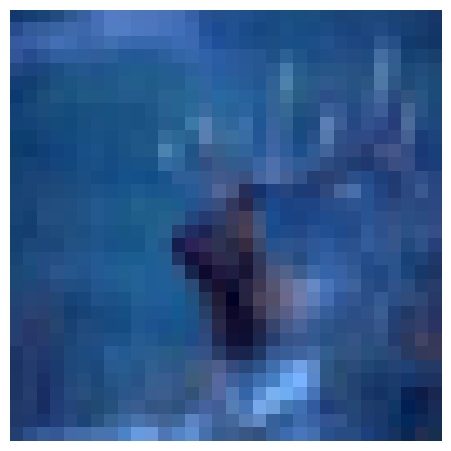

In [8]:
classes = test_loader.dataset.classes
def plot_figure(image):
    plt.imshow(np.transpose(image,(1,2,0)))
    plt.axis('off')
    plt.show()

rnd_sample_idx = np.random.randint(len(test_loader))
print(f'La imagen muestreada representa un: {classes[test_loader.dataset[rnd_sample_idx][1]]}')
image = test_loader.dataset[rnd_sample_idx][0]
image = (image - image.min()) / (image.max() -image.min() )
plot_figure(image)


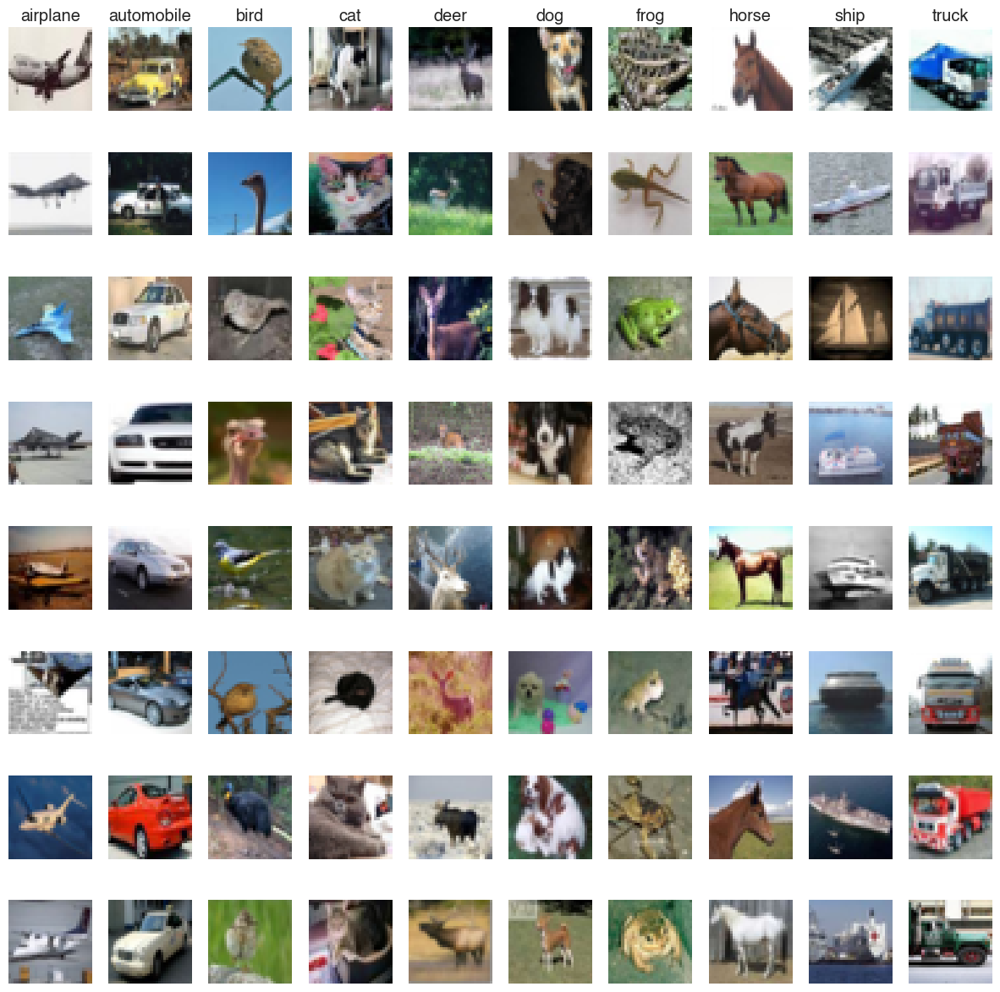

In [9]:
def plot_cifar10_grid():
    classes = test_loader.dataset.classes
    total_samples = 8
    plt.figure(figsize=(15,15))
    for label, sample in enumerate(classes):
        class_idxs = np.flatnonzero(label == np.array(test_loader.dataset.targets))
        sample_idxs = np.random.choice(class_idxs, total_samples, replace = False)
        for i, idx in enumerate(sample_idxs):
            plt_idx = i*len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)
            plt.imshow(test_loader.dataset.data[idx])
            plt.axis('off')
            
            if i == 0: plt.title(sample)
    plt.show()

plot_cifar10_grid() 

### Accuracy Function

We need a way to evaluate how well the model is doing. This function takes a model and a DataLoader, runs all the data through the model, and counts how many predictions match the true labels.

A couple of important details: we call `model.eval()` to turn off things like Dropout (which should only be active during training), and we wrap everything in `torch.no_grad()` so PyTorch doesn't waste memory tracking gradients — we're just predicting here, not training.

In [10]:
def accuracy(model, loader):
    num_correct = 0
    num_total = 0
    model.eval()
    model = model.to(device=device)
    with torch.no_grad():
        for (xi, yi) in loader:
            xi = xi.to(device=device, dtype=torch.float32)
            yi = yi.to(device=device, dtype=torch.long)
            scores = model(xi)  # (batch_size, num_classes)
            _, pred = scores.max(dim=1)  # pred shape: (batch_size,)
            num_correct += (pred == yi).sum()
            num_total += pred.size(0)
    return float(num_correct) / num_total

### Training Loop

This is the core of the whole notebook. Each epoch, we loop over mini-batches from the training set and repeat the same cycle:

1. Forward pass — feed images through the model and get scores
2. Compute cross-entropy loss between predictions and true labels
3. `cost.backward()` — PyTorch computes all the gradients automatically (this is where autograd really shines compared to doing it by hand in NumPy)
4. `optimiser.step()` — update the weights using Adam

We also track training cost and accuracy per epoch, and evaluate on the validation set at the end of each epoch. This lets us catch overfitting early — if training accuracy keeps going up but validation accuracy plateaus or drops, we know the model is memorizing instead of generalizing.

In [18]:
def train(model, optimiser, epochs=100):
    model = model.to(device=device)
    for epoch in range(epochs):
        model.train()
        train_cost_acum = 0
        train_correct = 0
        train_total = 0
        for i, (xi, yi) in enumerate(train_loader):
            xi = xi.to(device=device, dtype=torch.float32)
            yi = yi.to(device=device, dtype=torch.long)
            scores = model(xi)

            cost = F.cross_entropy(input=scores, target=yi)

            optimiser.zero_grad()
            cost.backward()
            optimiser.step()

            train_cost_acum += cost.item()
            train_correct += (torch.argmax(scores, dim=1) == yi).sum().item()
            train_total += yi.size(0)

        # Compute validation accuracy at end of each epoch
        val_acc = accuracy(model, val_loader)
        train_acc = train_correct / train_total
        train_cost = train_cost_acum / (i + 1)
        print(f'Epoch: {epoch}, train cost: {train_cost:.4f}, '
              f'train acc: {train_acc:.4f}, val acc: {val_acc:.4f}')

### Linear Baseline Model

Before jumping into CNNs, we want a baseline to compare against. This is basically the same kind of fully connected model we used in Activity 2a, but applied to CIFAR-10.

It just flattens the 3×32×32 image into a single vector of 3072 values and feeds it through one hidden layer (256 neurons with ReLU) to an output layer of 10 classes. The obvious limitation is that flattening throws away all the spatial structure — it has no idea that neighboring pixels are related. We expect something in the 45-55% range, which gives us a clear baseline for the CNN to beat.

In [19]:
# Linear baseline model: Flatten 3x32x32 -> 3072, then FC layers
hidden = 256
lr = 1e-3
epochs = 10

model1 = nn.Sequential(
    nn.Flatten(),                                          # 3x32x32 -> 3072
    nn.Linear(in_features=32*32*3, out_features=hidden),   # 3072 -> 256
    nn.ReLU(),
    nn.Linear(in_features=hidden, out_features=10)         # 256 -> 10 classes
)

optimiser = torch.optim.Adam(model1.parameters(), lr=lr)

In [20]:
train(model1, optimiser, epochs)

Epoch: 0, train cost: 1.7008, train acc: 0.4139, val acc: 0.4704
Epoch: 1, train cost: 1.4892, train acc: 0.4807, val acc: 0.4910
Epoch: 2, train cost: 1.4094, train acc: 0.5091, val acc: 0.5030
Epoch: 3, train cost: 1.3477, train acc: 0.5323, val acc: 0.4954
Epoch: 4, train cost: 1.2961, train acc: 0.5525, val acc: 0.5060
Epoch: 5, train cost: 1.2499, train acc: 0.5709, val acc: 0.4904
Epoch: 6, train cost: 1.2072, train acc: 0.5856, val acc: 0.5074
Epoch: 7, train cost: 1.1613, train acc: 0.6024, val acc: 0.5112
Epoch: 8, train cost: 1.1169, train acc: 0.6165, val acc: 0.5108
Epoch: 9, train cost: 1.0824, train acc: 0.6323, val acc: 0.5288


In [14]:
# Evaluate linear baseline on test set
linear_test_acc = accuracy(model1, test_loader)
print(f'Linear baseline - Test accuracy: {linear_test_acc:.4f}')

Linear baseline - Test accuracy: 0.5030


### CNN Model

Now the main event. Instead of flattening the image and losing all spatial info, a CNN processes the image as a 2D grid and learns to detect local patterns through small sliding filters.

Our architecture has **3 convolutional blocks**, each doing Conv2d → ReLU → MaxPool2d. The idea is:
- `Conv2d` with 3×3 filters scans the image and detects features (edges, textures, etc.)
- `ReLU` adds non-linearity
- `MaxPool2d` with 2×2 kernel shrinks the spatial size by half, keeping the strongest activations

So the feature maps go: 3 channels → 32 → 64 → 128, while spatial dimensions shrink: 32×32 → 16×16 → 8×8 → 4×4. We use `padding=1` on all conv layers to avoid losing pixels at the borders.

After the conv blocks, we flatten everything into a 2048-dim vector (128 × 4 × 4) and pass it through a couple of fully connected layers. We added `Dropout(0.5)` before the final layer — this randomly disables half the neurons during training, which is a simple but effective way to reduce overfitting.

The big advantage over the linear model is that convolutions exploit the spatial structure of images. Early layers learn to detect simple things like edges, and deeper layers combine those into more complex patterns (shapes, parts of objects). That hierarchical feature learning is why CNNs dominate image tasks.

In [23]:
# CNN model for CIFAR-10
# Architecture: 3 conv blocks (Conv2d -> ReLU -> MaxPool2d) + 2 FC layers
# Input: 3x32x32 (CIFAR-10 RGB images)

lr_cnn = 1e-3
epochs_cnn = 15

modelCNN1 = nn.Sequential(
    # Conv Block 1: 3 channels -> 32 filters, 3x3 kernel, padding=1 keeps spatial size
    nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1),   # -> 32x32x32
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),                                  # -> 32x16x16

    # Conv Block 2: 32 -> 64 filters
    nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1),  # -> 64x16x16
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),                                  # -> 64x8x8

    # Conv Block 3: 64 -> 128 filters
    nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1), # -> 128x8x8
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),                                  # -> 128x4x4

    # Flatten and FC layers
    nn.Flatten(),                                   # -> 128*4*4 = 2048
    nn.Linear(128 * 4 * 4, 256),                    # -> 256
    nn.ReLU(),
    nn.Dropout(0.5),                                # Regularization to prevent overfitting
    nn.Linear(256, 10)                              # -> 10 classes
)

optimiser = torch.optim.Adam(modelCNN1.parameters(), lr=lr_cnn)
epochs = epochs_cnn

In [24]:
train(modelCNN1, optimiser, epochs)

Epoch: 0, train cost: 1.4893, train acc: 0.4568, val acc: 0.6118
Epoch: 1, train cost: 1.0883, train acc: 0.6171, val acc: 0.6852
Epoch: 2, train cost: 0.9065, train acc: 0.6848, val acc: 0.7190
Epoch: 3, train cost: 0.7828, train acc: 0.7247, val acc: 0.7346
Epoch: 4, train cost: 0.7026, train acc: 0.7549, val acc: 0.7472
Epoch: 5, train cost: 0.6318, train acc: 0.7788, val acc: 0.7546
Epoch: 6, train cost: 0.5747, train acc: 0.7966, val acc: 0.7598
Epoch: 7, train cost: 0.5245, train acc: 0.8133, val acc: 0.7606
Epoch: 8, train cost: 0.4885, train acc: 0.8274, val acc: 0.7636
Epoch: 9, train cost: 0.4453, train acc: 0.8400, val acc: 0.7498
Epoch: 10, train cost: 0.4195, train acc: 0.8507, val acc: 0.7484
Epoch: 11, train cost: 0.3818, train acc: 0.8621, val acc: 0.7648
Epoch: 12, train cost: 0.3574, train acc: 0.8710, val acc: 0.7648
Epoch: 13, train cost: 0.3346, train acc: 0.8803, val acc: 0.7626
Epoch: 14, train cost: 0.3133, train acc: 0.8854, val acc: 0.7662


In [25]:
# Evaluate CNN on test set
cnn_test_acc = accuracy(modelCNN1, test_loader)
print(f'CNN model - Test accuracy: {cnn_test_acc:.4f}')
print(f'\nComparison:')
print(f'  Linear baseline: {linear_test_acc:.4f}')
print(f'  CNN model:       {cnn_test_acc:.4f}')
print(f'  Improvement:     {(cnn_test_acc - linear_test_acc)*100:.2f} percentage points')

CNN model - Test accuracy: 0.7654

Comparison:
  Linear baseline: 0.5030
  CNN model:       0.7654
  Improvement:     26.24 percentage points


### Analysis and Conclusions

**Results**

| Model | Architecture | Test Accuracy |
|-------|-------------|:------------:|
| Linear Baseline | Flatten → FC(3072,256) → ReLU → FC(256,10) | **50.30%** |
| CNN | 3×(Conv→ReLU→Pool) → FC(2048,256) → Dropout → FC(256,10) | **76.54%** |

The CNN outperforms the linear model by over 26 percentage points, comfortably surpassing the 65% target. Not bad for a relatively simple 3-block architecture.

**What we learned**

- **Spatial structure matters a lot.** Flattening the image throws away the relationship between neighboring pixels, and it shows — the linear model barely breaks 50%. The CNN keeps that structure intact and learns to detect increasingly complex patterns at each layer.

- **Overfitting is a real concern.** During training we saw the CNN's train accuracy reach ~88% while validation sat around ~76%. The Dropout layer helps, but there's still a gap. Data augmentation (random flips, crops, etc.) would probably close that gap further, but we kept things simple for this activity.

- **PyTorch makes this way easier than NumPy.** In Activity 1b we had to implement backprop manually for every layer. Here, `cost.backward()` does all of that automatically. The `nn.Sequential` API also makes defining architectures really clean — just stack the layers and go.

- **GPU acceleration helps.** Running on MPS (Apple Silicon) made training the CNN practical. On CPU it would've taken considerably longer to iterate on hyperparameters.

**Challenges**

- Getting the dimensions right after the conv/pool layers was a bit tricky at first — you have to carefully track how each MaxPool halves the spatial size to compute the correct input size for the first Linear layer (128 × 4 × 4 = 2048).
- Balancing model capacity vs. overfitting: adding more filters or layers could potentially improve accuracy, but also risks overfitting given CIFAR-10's limited size. Dropout helped keep things in check.